# Assignment 8: DT

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features +  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features +  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 5, 10, 50], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation(use gridsearch cv or randomsearch cv)/simple cross validation data(you can write your own for loops refer sample solution)</li>
        </ul>
    </li>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/Gp2DQmh.jpg' width=500px> with X-axis as <strong>min_sample_split</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/fgN9aUP.jpg' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>n_estimators</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='https://i.imgur.com/wMQDTFe.jpg' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='https://i.imgur.com/IdN5Ctv.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud(https://www.geeksforgeeks.org/generating-word-cloud-python/) with the words of essay text of these `false positive data points`</li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
   <li><b>Task 2: </b>For this task consider set-1 features. Select all the features which are having non-zero feature importance.You can get the feature importance using  'feature_importances_` 
   (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), discard the all other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM), you need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3<br>
  Note: when you want to find the feature importance make sure you don't use max_depth parameter keep it None.
  </li>
    <br>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format
        <img src='http://i.imgur.com/YVpIGGE.jpg' width=400px>
    </li>
</ol>

<h1>1. Decision Tree </h1>

## 1.1 Loading Data

In [2]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/

import pickle
from tqdm import tqdm
import os

from chart_studio import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

In [3]:
data  = pd.read_csv('preprocessed_data.csv')

In [4]:
y = data['project_is_approved'].values
X = data.drop(['project_is_approved'], axis=1)
X.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05


<h2>1.2 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [5]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

In [6]:
import pandas as pd
df = pd.DataFrame(y_train)
df[0].value_counts()

1    41615
0     7426
Name: 0, dtype: int64

# Set 1: categorical, numerical features + preprocessed_eassay (TFIDF)

<h2>1.3 Make Data Model Ready: encoding eassay, and project_title</h2>

In [6]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,3), max_features=6500)
vectorizer.fit(X_train['essay'].values) # fit has to happen only on train data



# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_tfidf = vectorizer.transform(X_train['essay'].values)
X_cv_essay_tfidf = vectorizer.transform(X_cv['essay'].values)
X_test_essay_tfidf = vectorizer.transform(X_test['essay'].values)

print("After vectorizations")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_cv_essay_tfidf.shape, y_cv.shape)
print(X_test_essay_tfidf.shape, y_test.shape)
print("="*100)


(49041, 8) (49041,)
(24155, 8) (24155,)
(36052, 8) (36052,)
After vectorizations
(49041, 6500) (49041,)
(24155, 6500) (24155,)
(36052, 6500) (36052,)


In [7]:
X_train_essay_tfidf

<49041x6500 sparse matrix of type '<class 'numpy.float64'>'
	with 6832390 stored elements in Compressed Sparse Row format>

<h2>1.4 Make Data Model Ready: encoding numerical, categorical features</h2>

In [8]:
vectorizer = TfidfVectorizer()
vectorizer.fit(X_train['school_state'].values) # fit has to happen only on train data

# we use the fitted TfidfVectorizer to convert the text to vector
X_train_state_ohe = vectorizer.transform(X_train['school_state'].values)
X_cv_state_ohe = vectorizer.transform(X_cv['school_state'].values)
X_test_state_ohe = vectorizer.transform(X_test['school_state'].values)

print("After vectorizations")
print(X_train_state_ohe.shape, y_train.shape)
print(X_cv_state_ohe.shape, y_cv.shape)
print(X_test_state_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(49041, 51) (49041,)
(24155, 51) (24155,)
(36052, 51) (36052,)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


In [9]:
X_train_state_ohe

<49041x51 sparse matrix of type '<class 'numpy.float64'>'
	with 49041 stored elements in Compressed Sparse Row format>

In [10]:
vectorizer = TfidfVectorizer()
vectorizer.fit(X_train['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted TfidfVectorizer to convert the text to vector
X_train_teacher_ohe = vectorizer.transform(X_train['teacher_prefix'].values)
X_cv_teacher_ohe = vectorizer.transform(X_cv['teacher_prefix'].values)
X_test_teacher_ohe = vectorizer.transform(X_test['teacher_prefix'].values)

print("After vectorizations")
print(X_train_teacher_ohe.shape, y_train.shape)
print(X_cv_teacher_ohe.shape, y_cv.shape)
print(X_test_teacher_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(49041, 5) (49041,)
(24155, 5) (24155,)
(36052, 5) (36052,)
['dr', 'mr', 'mrs', 'ms', 'teacher']


In [11]:
vectorizer = TfidfVectorizer()
vectorizer.fit(X_train['project_grade_category'].values) # fit has to happen only on train data

# we use the fitted TfidfVectorizer to convert the text to vector
X_train_grade_ohe = vectorizer.transform(X_train['project_grade_category'].values)
X_cv_grade_ohe = vectorizer.transform(X_cv['project_grade_category'].values)
X_test_grade_ohe = vectorizer.transform(X_test['project_grade_category'].values)

print("After vectorizations")
print(X_train_grade_ohe.shape, y_train.shape)
print(X_cv_grade_ohe.shape, y_cv.shape)
print(X_test_grade_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)
# ['grades_3_5', 'grades_6_8', 'grades_9_12', 'grades_prek_2']
# ['dr', 'mr', 'mrs', 'ms', 'teacher']


After vectorizations
(49041, 4) (49041,)
(24155, 4) (24155,)
(36052, 4) (36052,)
['grades_3_5', 'grades_6_8', 'grades_9_12', 'grades_prek_2']


In [12]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()

normalizer.fit(X_train['price'].values.reshape(-1,1))

X_train_price_norm = normalizer.transform(X_train['price'].values.reshape(-1,1))
X_cv_price_norm = normalizer.transform(X_cv['price'].values.reshape(-1,1))
X_test_price_norm = normalizer.transform(X_test['price'].values.reshape(-1,1))



print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_cv_price_norm.shape, y_cv.shape)
print(X_test_price_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(49041, 1) (49041,)
(24155, 1) (24155,)
(36052, 1) (36052,)


In [13]:
vectorizer = TfidfVectorizer()
vectorizer.fit(X_train['clean_categories'].values) # fit has to happen only on train data

# we use the fitted TfidfVectorizer to convert the text to vector
X_train_category_ohe = vectorizer.transform(X_train['clean_categories'].values)
X_cv_category_ohe = vectorizer.transform(X_cv['clean_categories'].values)
X_test_category_ohe = vectorizer.transform(X_test['clean_categories'].values)

print("After vectorizations")
print(X_train_category_ohe.shape, y_train.shape)
print(X_cv_category_ohe.shape, y_cv.shape)
print(X_test_category_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(49041, 9) (49041,)
(24155, 9) (24155,)
(36052, 9) (36052,)
['appliedlearning', 'care_hunger', 'health_sports', 'history_civics', 'literacy_language', 'math_science', 'music_arts', 'specialneeds', 'warmth']


In [14]:
normalizer = Normalizer()

normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

X_train_prevpostprojects_norm = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_cv_prevpostprojects_norm = normalizer.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_test_prevpostprojects_norm = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))



print("After vectorizations")
print(X_train_prevpostprojects_norm.shape, y_train.shape)
print(X_cv_prevpostprojects_norm.shape, y_cv.shape)
print(X_test_prevpostprojects_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(49041, 1) (49041,)
(24155, 1) (24155,)
(36052, 1) (36052,)


In [15]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((X_train_essay_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe, X_train_price_norm,X_train_category_ohe, X_train_prevpostprojects_norm)).tocsr()
X_cr = hstack((X_cv_essay_tfidf, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe, X_cv_price_norm, X_cv_category_ohe, X_cv_prevpostprojects_norm)).tocsr()
X_te = hstack((X_test_essay_tfidf, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe, X_test_price_norm, X_test_category_ohe, X_test_prevpostprojects_norm)).tocsr()




print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(49041, 6571) (49041,)
(24155, 6571) (24155,)
(36052, 6571) (36052,)


<h2>1.5 Appling  Decision Tree on different kind of featurization as mentioned in the instructions</h2>

<br>Apply  Decision Tree on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

In [16]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your tr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    if data.shape[0]%1000 !=0:
        y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

In [17]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score

max_depth = [1, 5, 10, 50]
min_samples_split = [5, 10, 100, 500]

x1 = []
y1 = []
z1 = []
z2 = []
for i in tqdm(max_depth):
    for j in min_samples_split:
        clf = DecisionTreeClassifier(min_samples_split=j,max_depth=i)
        clf.fit(X_tr, y_train)


        y_train_pred = batch_predict(clf, X_tr)    
        y_cv_pred = batch_predict(clf, X_cr)

      
        z1.append(roc_auc_score(y_train,y_train_pred))
        z2.append(roc_auc_score(y_cv, y_cv_pred))
        x1.append(i)
        y1.append(j)


100%|███████████████████████████████████████████████████████████████████████████████████| 4/4 [11:27<00:00, 171.92s/it]


In [69]:
#results = results.sort_values(['param_n_neighbors'])
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np




# https://plot.ly/python/3d-axes/
# trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
# trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name = 'Cross validation')
# data = [trace1, trace2]

# layout = go.Layout(scene = dict(
#         xaxis = dict(title='max_depth'),
#         yaxis = dict(title='min_samples_split'),
#         zaxis = dict(title='AUC'),))

# fig = go.Figure(data=data, layout=layout)
# offline.iplot(fig, filename='3d-scatter-colorscale')


### PERFORMANCE OF TEST SET

In [19]:
data = {'min_samples_split':y1,
        'max_depth':x1,
        'AUC':z2}
df = pd.DataFrame(data) 

In [1]:
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set()
testset = df
testset = testset.pivot("min_samples_split", "max_depth", "AUC")
ax = sns.heatmap(testset,annot=True)

NameError: name 'df' is not defined

In [21]:
print(x1)
print(y1)
print(z2)
m = max(z2)
k = [i for i, j in enumerate(z2) if j == m]
print('*************************************************************************************************************************')
print(z2[k[0]])
print(x1[k[0]])
print(y1[k[0]])

[1, 1, 1, 1, 5, 5, 5, 5, 10, 10, 10, 10, 50, 50, 50, 50]
[5, 10, 100, 500, 5, 10, 100, 500, 5, 10, 100, 500, 5, 10, 100, 500]
[0.5476816095198921, 0.5476816095198921, 0.5476816095198921, 0.5476816095198921, 0.6030419929588627, 0.6032739596729433, 0.6032179039963428, 0.6032293432497187, 0.6102698135005494, 0.6095251347810853, 0.6120419706273057, 0.6135862231422006, 0.5424664705811885, 0.542615247576259, 0.5605554653310848, 0.5922913092650375]
*************************************************************************************************************************
0.6135862231422006
10
500


### BEST PARAMS = {'max_depth': 10, 'min_samples_split': 100}

### PERFORMANCE OF TRAINSET

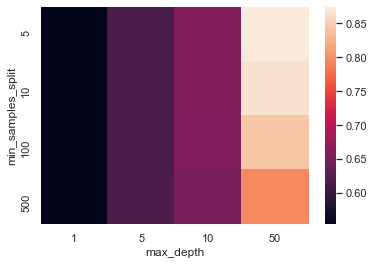

In [22]:
data = {'min_samples_split':y1,
        'max_depth':x1,
        'AUC':z1}
df = pd.DataFrame(data)  
df.head()
trainset = df
trainset = trainset.pivot("min_samples_split", "max_depth", "AUC")
ax = sns.heatmap(trainset)

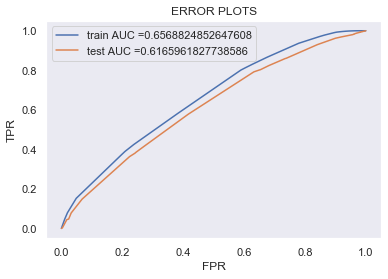

In [23]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

clf = DecisionTreeClassifier(max_depth =10, min_samples_split=100)
clf.fit(X_tr, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(clf, X_tr)    
y_test_pred = batch_predict(clf, X_te)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [24]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

In [25]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)

print("Test confusion matrix")
print(confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t)))

the maximum value of tpr*(1-fpr) 0.3592888254422287 for threshold 0.859
Test confusion matrix
[[ 3182  2277]
 [12904 17689]]


### FALSE POSITIVE EXTRACTION

In [26]:
X_te_df = pd.DataFrame(X_te.todense())

In [27]:
best_t

0.8590992889122991

In [28]:
y_test_predict = predict_with_best_t(y_test_pred, best_t)
print(y_test.shape)
#y_test_predict

(36052,)


In [29]:
indices = []
j=0
for i in range(len(X_te_df)):
    if((y_test[i]==0) & (y_test_predict[i]==1)):
        indices.append(i)
        j = j + 1


In [30]:
X_te_FP = X_te_df.loc[indices]

In [31]:
import scipy
from scipy.sparse import csr_matrix
X_te_FP = scipy.sparse.csr_matrix(X_te_FP.values)

In [32]:
X_te_FP

<2277x6571 sparse matrix of type '<class 'numpy.float64'>'
	with 319746 stored elements in Compressed Sparse Row format>

In [33]:
data = pd.DataFrame(X_test['essay'])

In [34]:
data.reset_index(inplace = True, drop = True) 

In [35]:
data = data.loc[indices]

### GENERATING WORDCLOUD

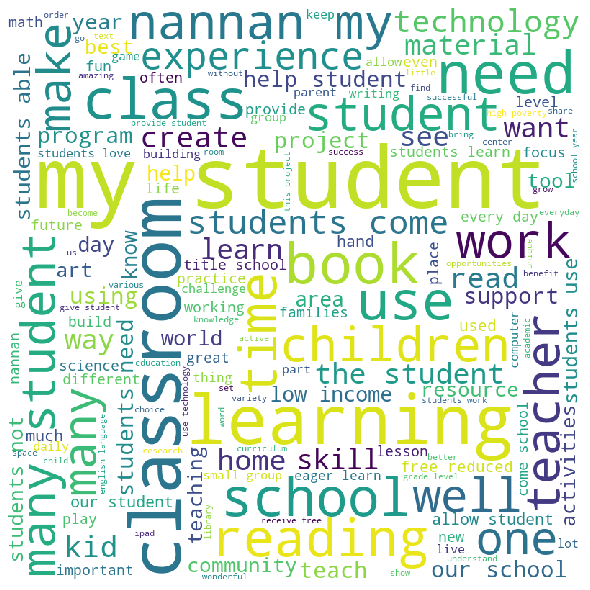

In [36]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd

comment_words = '' 
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in data.essay: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

### BOX PLOT WITH PRICE VALUES OF FP DATA POINTS OF THE TEST DATASET

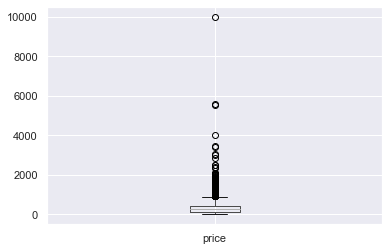

In [37]:
data_price = pd.DataFrame(X_test['price'])
data_price.reset_index(inplace = True, drop = True) 
data_price = data_price.loc[indices]
boxplot = data_price.boxplot(column=['price'])

### pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`

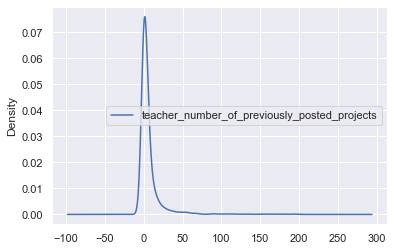

In [38]:
data_prev_projects = pd.DataFrame(X_test['teacher_number_of_previously_posted_projects'])
data_prev_projects.reset_index(inplace = True, drop = True) 
data_prev_projects = data_prev_projects.loc[indices]
ax = data_prev_projects.plot.kde()

### BEFORE TASK 1's TFIDFW2V part I HAVE DONE TASK 2 SINCE I HAD TO DO IT ON SET 1.

## TASK 2 : Getting top features using `feature_importances_`

In [39]:
clf = DecisionTreeClassifier(max_depth =None, min_samples_split=100)
clf.fit(X_tr, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=100,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [40]:
imp_features = clf.feature_importances_

In [41]:
dframe = pd.DataFrame(imp_features)
idx = []
for i in range(len(dframe[0])):
    if(dframe[0][i]!=0):
        idx.append(i)
X_tr_new = X_tr[:,idx]
X_cr_new = X_cr[:,idx]
X_te_new = X_te[:,idx]
        

In [42]:
print("New Data matrix after removing useless features")
print(X_tr_new.shape, y_train.shape)
print(X_cr_new.shape, y_cv.shape)
print(X_te_new.shape, y_test.shape)
print("="*100)

New Data matrix after removing useless features
(49041, 1997) (49041,)
(24155, 1997) (24155,)
(36052, 1997) (36052,)


### I AM USING LOGISTIC REGRESSION AS MY MODEL HERE

100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:18<00:00,  1.67s/it]


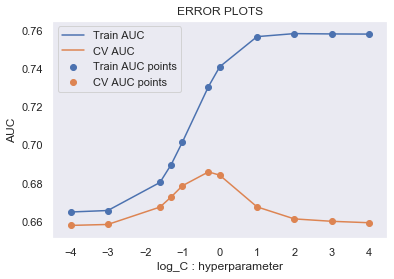

In [44]:
import math
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from tqdm import tqdm

C = [0.0001,0.001,0.025,0.05,0.1,0.5,1,10,100,1000,10000]

train_auc = []
cv_auc = []
log_C= [math.log10(i) for i in C]

for i in tqdm(C):
    clf = LogisticRegression(C=i)
    clf.fit(X_tr_new, y_train)


    y_train_pred = batch_predict(clf, X_tr_new)    
    y_cv_pred = batch_predict(clf, X_cr_new)

      
    train_auc.append(roc_auc_score(y_train,y_train_pred))
    cv_auc.append(roc_auc_score(y_cv, y_cv_pred))
    
    
        
plt.plot(log_C, train_auc, label='Train AUC')
plt.plot(log_C, cv_auc, label='CV AUC')

plt.scatter(log_C, train_auc, label='Train AUC points')
plt.scatter(log_C, cv_auc, label='CV AUC points')

plt.legend()
plt.xlabel("log_C : hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

### BEST PARAMETER 'C' = 0.5

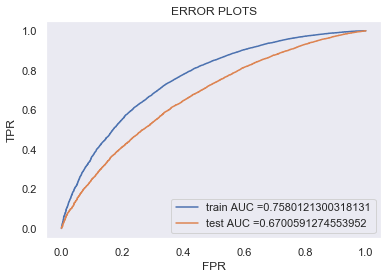

In [45]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_model = LogisticRegression(random_state = 0,C=0.5)
best_model.fit(X_tr_new, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(clf, X_tr_new)    
y_test_pred = batch_predict(clf, X_te_new)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

### CONFUSION MATRIX

In [46]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)

print("Test confusion matrix")
print(confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t)))

the maximum value of tpr*(1-fpr) 0.4797134927245147 for threshold 0.835
Test confusion matrix
[[ 2984  2475]
 [ 9402 21191]]


### FALSE POSITIVE POINTS EXTRACTION

In [47]:
X_te_df = pd.DataFrame(X_te_new.todense())
y_test_predict = predict_with_best_t(y_test_pred, best_t)
print(y_test.shape)
#y_test_predict
indices = []
j=0
for i in range(len(X_te_df)):
    if((y_test[i]==0) & (y_test_predict[i]==1)):
        indices.append(i)
        j = j + 1
X_te_FP = X_te_df.loc[indices]

import scipy
from scipy.sparse import csr_matrix
X_te_FP = scipy.sparse.csr_matrix(X_te_FP.values)

data = pd.DataFrame(X_test['essay'])
data.reset_index(inplace = True, drop = True)
data = data.loc[indices] 

(36052,)


### GENERATING WORDCLOUD

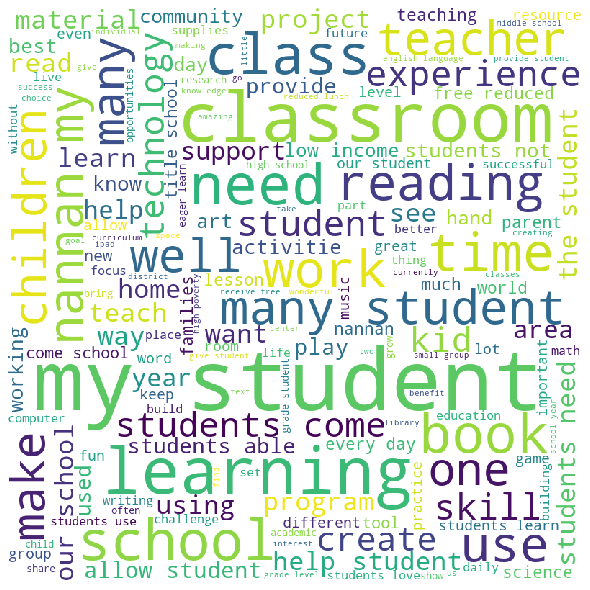

In [48]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd

comment_words = '' 
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in data.essay: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

# Set 2: categorical, numerical features + preprocessed_eassay (TFIDF W2V)

In [7]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [10]:
X_train['essay'].values[0]

'located bay area city melting pot diversity culture school home amazing students enjoy embrace with variety excited motivated learners class dedicated implementing science technology classroom students eager learn new science curriculum well develop skills strategies make better readers in classroom students full energy positivity confidence they enjoy learning new things especially topics related science they inquisitive determined educator i intend continue nurturing drive as enthusiastic energetic educator i looking forward helping students reach stars theoretically literally my students benefit mobile science center enable hands investigators scientists this center accessible students provide variety scientific tools items explore investigate including rocks minerals microscopes reptile sea life specimens etc they also benefit listening center educational texts help successful new curriculum emphasizing science they listen informational texts provided facts ocean life habitats wel

In [9]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['essay'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))

In [12]:
tfidf_model.get_feature_names()

['00',
 '000',
 '001',
 '002',
 '00am',
 '00p',
 '00pm',
 '01',
 '010',
 '01075rm',
 '01g',
 '02',
 '022x10',
 '024',
 '025',
 '03',
 '04',
 '047',
 '05',
 '050',
 '059',
 '06',
 '072',
 '076',
 '08',
 '09',
 '0mp',
 '0ver',
 '10',
 '100',
 '1000',
 '1000blackgirlbooks',
 '1000s',
 '10027',
 '100cm',
 '100m',
 '100s',
 '100th',
 '101',
 '102',
 '1020',
 '103',
 '104',
 '1043',
 '105',
 '1057',
 '106',
 '107',
 '1077',
 '108',
 '1082',
 '1084',
 '109',
 '10cm',
 '10k',
 '10pk',
 '10pm',
 '10s',
 '10th',
 '10u',
 '10x',
 '10x10',
 '10yrs',
 '11',
 '110',
 '1100',
 '11000',
 '111',
 '112',
 '1120',
 '11242',
 '113',
 '114',
 '115',
 '116',
 '117',
 '11pm',
 '11th',
 '11x25',
 '12',
 '120',
 '1200',
 '1202',
 '1204',
 '120s',
 '120th',
 '121',
 '1212',
 '123',
 '1238',
 '123d',
 '123s',
 '124',
 '1248',
 '125',
 '1250',
 '126',
 '127',
 '1279',
 '128',
 '12gb',
 '12inch',
 '12pm',
 '12th',
 '12u',
 '12x',
 '12x16',
 '12x18',
 '13',
 '130',
 '1300',
 '1307',
 '131',
 '131210',
 '132',
 '133

In [14]:
list(tfidf_model.idf_)

[7.081933481517651,
 5.942499198329286,
 11.1072851722528,
 11.1072851722528,
 10.00867288358469,
 11.1072851722528,
 10.190994440378645,
 10.701820064144636,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 10.00867288358469,
 11.1072851722528,
 11.1072851722528,
 10.414137991692854,
 10.701820064144636,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 10.701820064144636,
 11.1072851722528,
 10.414137991692854,
 4.536402209913216,
 3.790736995069824,
 7.06423390441825,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 11.1072851722528,
 10.414137991692854,
 9.402537080014374,
 8.804700079258755,
 9.854522203757432,
 11.1072851722528,
 9.161375023197486,
 9.603207775476527,
 11.1072851722528,
 9.315525703024745,
 11.1072851722528,
 11.1072851722528,
 9.854522203757432,
 11.1072851722528,
 9.603207775476527,
 11.1072851722528,
 10

In [8]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['essay'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

tfidfw2v_xtrain = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidfw2v_xtrain.append(vector)
tfidfw2v_xtrain = pd.DataFrame(tfidfw2v_xtrain)
tfidfw2v_xtrain = scipy.sparse.csr_matrix(tfidfw2v_xtrain.values)
    
tfidfw2v_xcv = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_cv['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidfw2v_xcv.append(vector)
tfidfw2v_xcv = pd.DataFrame(tfidfw2v_xcv)
tfidfw2v_xcv = scipy.sparse.csr_matrix(tfidfw2v_xcv.values)
    
tfidfw2v_xtest = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidfw2v_xtest.append(vector)
tfidfw2v_xtest = pd.DataFrame(tfidfw2v_xtest)
tfidfw2v_xtest = scipy.sparse.csr_matrix(tfidfw2v_xtest.values)

print("After vectorizations")
print(tfidfw2v_xtrain.shape, y_train.shape)
print(tfidfw2v_xcv.shape, y_cv.shape)
print(tfidfw2v_xtest.shape, y_test.shape)
print("="*100)

(49041, 8) (49041,)
(24155, 8) (24155,)
(36052, 8) (36052,)


100%|███████████████████████████████████████████████████████████████████████████| 49041/49041 [04:16<00:00, 191.43it/s]


NameError: name 'scipy' is not defined

In [51]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((tfidfw2v_xtrain, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe, X_train_price_norm,X_train_category_ohe, X_train_prevpostprojects_norm)).tocsr()
X_cr = hstack((tfidfw2v_xcv, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe, X_cv_price_norm, X_cv_category_ohe, X_cv_prevpostprojects_norm)).tocsr()
X_te = hstack((tfidfw2v_xtest, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe, X_test_price_norm, X_test_category_ohe, X_test_prevpostprojects_norm)).tocsr()




print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(49041, 371) (49041,)
(24155, 371) (24155,)
(36052, 371) (36052,)


In [53]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score

max_depth = [1, 5, 10, 50]
min_samples_split = [5, 10, 100, 500]

x1 = []
y1 = []
z1 = []
z2 = []
for i in tqdm(max_depth):
    for j in min_samples_split:
        clf = DecisionTreeClassifier(min_samples_split=j,max_depth=i)
        clf.fit(X_tr, y_train)


        y_train_pred = batch_predict(clf, X_tr)    
        y_cv_pred = batch_predict(clf, X_cr)

      
        z1.append(roc_auc_score(y_train,y_train_pred))
        z2.append(roc_auc_score(y_cv, y_cv_pred))
        x1.append(i)
        y1.append(j)

100%|███████████████████████████████████████████████████████████████████████████████████| 4/4 [10:19<00:00, 154.80s/it]


In [68]:
#results = results.sort_values(['param_n_neighbors'])
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np




#https://plot.ly/python/3d-axes/
# trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
# trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name = 'Cross validation')
# data = [trace1, trace2]

# layout = go.Layout(scene = dict(
#         xaxis = dict(title='max_depth'),
#         yaxis = dict(title='min_samples_split'),
#         zaxis = dict(title='AUC'),))

# fig = go.Figure(data=data, layout=layout)
# offline.iplot(fig, filename='3d-scatter-colorscale')


### PERFORMANCE OF TEST SET

In [55]:
data = {'min_samples_split':y1,
        'max_depth':x1,
        'AUC':z2}
df = pd.DataFrame(data) 

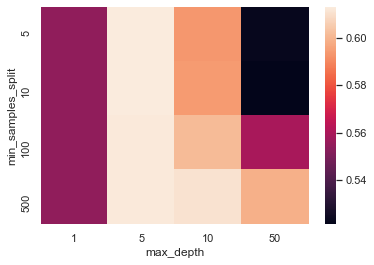

In [56]:
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set()
testset = df
testset = testset.pivot("min_samples_split", "max_depth", "AUC")
ax = sns.heatmap(testset)

In [57]:
print(x1)
print(y1)
print(z2)
m = max(z2)
k = [i for i, j in enumerate(z2) if j == m]
print('*************************************************************************************************************************')
print(z2[k[0]])
print(x1[k[0]])
print(y1[k[0]])

[1, 1, 1, 1, 5, 5, 5, 5, 10, 10, 10, 10, 50, 50, 50, 50]
[5, 10, 100, 500, 5, 10, 100, 500, 5, 10, 100, 500, 5, 10, 100, 500]
[0.5544767327987581, 0.5544767327987581, 0.5544767327987581, 0.5544767327987581, 0.6129826974722625, 0.6129826974722625, 0.6125914683366935, 0.6125914683366935, 0.5933073951097838, 0.5941706752078335, 0.6015201453722998, 0.6107845465518646, 0.522907001498082, 0.5213761025605972, 0.5595451958297458, 0.59888175328496]
*************************************************************************************************************************
0.6129826974722625
5
5


### BEST PARAMS = {'max_depth': 10, 'min_samples_split': 500}

### PERFORMANCE OF TRAIN SET

In [58]:
data = {'min_samples_split':y1,
        'max_depth':x1,
        'AUC':z1}
df = pd.DataFrame(data) 

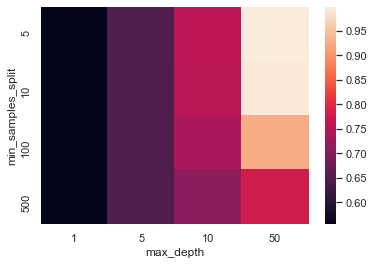

In [59]:
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set()
trainset = df
trainset = trainset.pivot("min_samples_split", "max_depth", "AUC")
ax = sns.heatmap(trainset)

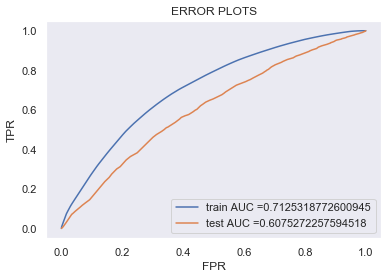

In [60]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

clf = DecisionTreeClassifier(max_depth =10, min_samples_split=500)
clf.fit(X_tr, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(clf, X_tr)    
y_test_pred = batch_predict(clf, X_te)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

### CONFUSION MATRIX

In [61]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)

print("Test confusion matrix")
print(confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t)))

the maximum value of tpr*(1-fpr) 0.43423260409835207 for threshold 0.856
Test confusion matrix
[[ 2871  2588]
 [11046 19547]]


### FALSE POSITIVE EXTRACTION

In [62]:
X_te_df = pd.DataFrame(X_te.todense())
best_t
y_test_predict = predict_with_best_t(y_test_pred, best_t)
print(y_test.shape)
#y_test_predict
indices = []
j=0
for i in range(len(X_te_df)):
    if((y_test[i]==0) & (y_test_predict[i]==1)):
        indices.append(i)
        j = j + 1
X_te_FP = X_te_df.loc[indices]

import scipy
from scipy.sparse import csr_matrix
X_te_FP = scipy.sparse.csr_matrix(X_te_FP.values)

data = pd.DataFrame(X_test['essay'])
data.reset_index(inplace = True, drop = True)
data = data.loc[indices] 

(36052,)


### GENERATING WORDCLOUD

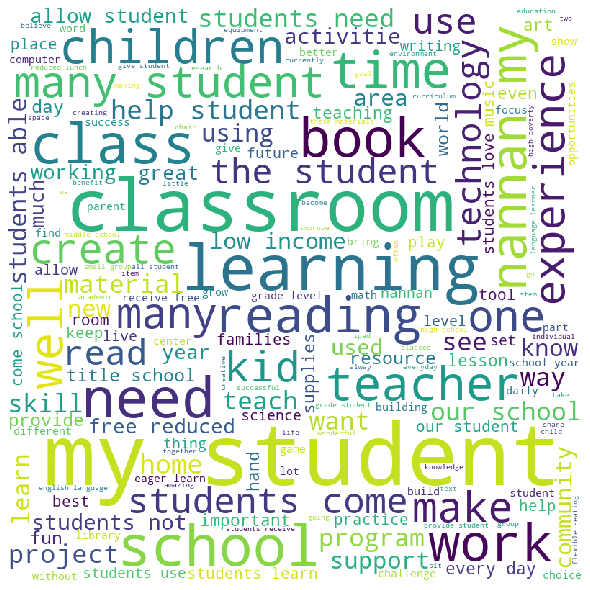

In [63]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd

comment_words = '' 
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in data.essay: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

### BOX PLOT WITH PRICE VALUES OF FP DATA POINTS OF THE TEST DATASET

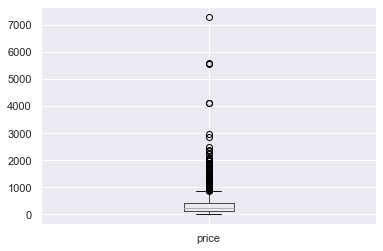

In [64]:
data_price = pd.DataFrame(X_test['price'])
data_price.reset_index(inplace = True, drop = True) 
data_price = data_price.loc[indices]
boxplot = data_price.boxplot(column=['price'])

### pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`

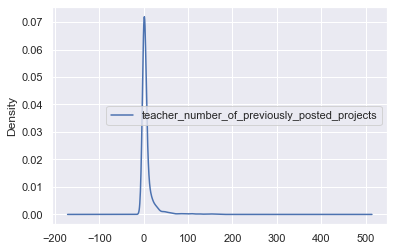

In [65]:
data_prev_projects = pd.DataFrame(X_test['teacher_number_of_previously_posted_projects'])
data_prev_projects.reset_index(inplace = True, drop = True) 
data_prev_projects = data_prev_projects.loc[indices]
ax = data_prev_projects.plot.kde()

# SUMMARY OF MODELS

In [67]:
from prettytable import PrettyTable
t = PrettyTable(['S.No','Vectorizer', 'Model','Hyper-Parameter','TEST-AUC'])
t.add_row([1,'TFIDF','DECISION TREES','max_depth =10, min_samples_split=100',.6166])
t.add_row([2,'TFIDF(useful_features)','LOGISTIC REGRESSION','C=0.5',.6700])
t.add_row([3,'TFIDFW2V','DECISION TREES','max_depth =10 and min_samples_split=500',.6075])
print(t)

+------+------------------------+---------------------+-----------------------------------------+----------+
| S.No |       Vectorizer       |        Model        |             Hyper-Parameter             | TEST-AUC |
+------+------------------------+---------------------+-----------------------------------------+----------+
|  1   |         TFIDF          |    DECISION TREES   |   max_depth =10, min_samples_split=100  |  0.6166  |
|  2   | TFIDF(useful_features) | LOGISTIC REGRESSION |                  C=0.5                  |   0.67   |
|  3   |        TFIDFW2V        |    DECISION TREES   | max_depth =10 and min_samples_split=500 |  0.6075  |
+------+------------------------+---------------------+-----------------------------------------+----------+
